## Trained with Fast.ai library - successful case

This shows successful training. Former attempt with fast.ai library have failed, this is attempt to make it done.

### Change from the last attempt

Froze early layer weights, trained later laters only.

> lrs = np.array([0.0]*34 + [1e-5]*6 + [1e-4]*3 + [1e-3] *6)

### Anything else to try

Training was quite slow, due to hard to adjust parameters/model layers.

- lr_find() cannot be used with too small dataset.
- Loss behaves very sensitive to parameters/learning rates. Increasing dropout/augmentation or decreasing learning rates make it slow to converge, and vice versa.

Further tuning makes it faster, but it would be better to go straight; get more data.

In [1]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
np.warnings.filterwarnings('ignore')
np.random.seed(1001)

import os
import sys
import shutil
from pathlib import Path

import IPython
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

matplotlib.style.use('ggplot')
%matplotlib inline

from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

In [2]:
folder = 'work_fastai'
PATH = Path('./dataset')
sz = 224
arch = vgg16
bs = 16

In [3]:
print(torch.cuda.is_available(), torch.backends.cudnn.enabled)

True True


In [4]:
# Make data files csv
train_files = list(PATH.glob('train/*/*.jpg'))
y_train     = [f.parent for f in train_files]
train_files = [f.parent.name+'/'+f.name for f in train_files]
df = pd.DataFrame()
df['fnames'] = train_files
df['target'] = y_train
df.to_csv(PATH/'labels.csv', index=False)

In [5]:
from sklearn.model_selection import train_test_split
_, val_idxs, _, _ = train_test_split(list(range(len(train_files))), y_train, test_size=0.2, random_state=42)

In [6]:
tfms = tfms_from_model(arch, sz,
                       aug_tfms=transforms_side_on+[Cutout(n_holes=3, length=40), RandomBlur()],
                       max_zoom=1.5)
data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name='test',
                                   val_idxs=val_idxs, tfms=tfms, bs=bs)
classes = [Path(c).name for c in data.classes]

In [7]:
model = nn.Sequential(*children(arch(pre=True))[:-2],
                      nn.Dropout2d(0.05),
                      nn.Conv2d(512, len(data.classes), 3, padding=1), 
                      nn.Dropout2d(0.1),
                      nn.AdaptiveAvgPool2d(1), Flatten(), 
                      nn.Dropout2d(0.3),
                      nn.LogSoftmax())

learn = ConvLearner.from_model_data(model, data)

# skip learn.lr_find() due to data size too small

In [8]:
lrs = np.array([0.0]*34 + [1e-5]*6 + [1e-4]*3 + [1e-3] *6)
learn.fit(lrs[-1], 5)

epoch      trn_loss   val_loss   accuracy                
    0      1.760697   1.714399   0.333333  
    1      1.73821    1.535951   0.333333                
    2      1.723496   1.376791   0.666667                
    3      1.63402    1.119987   0.6                     
    4      1.562287   1.280035   0.466667                



[1.280035376548767, 0.46666666865348816]

In [9]:
lrs = np.array([0.0]*34 + [1e-5]*6 + [1e-4]*3 + [1e-3] *6)
learn.unfreeze()
learn.fit(lrs, n_cycle=3, cycle_len=9, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                
    0      1.385378   1.024843   0.533333  
    1      1.27977    0.923811   0.8                     
    2      1.237174   0.749343   1.0                     
    3      1.221348   0.781106   0.933333                
    4      1.177334   0.728944   1.0                     
    5      1.103526   0.651034   1.0                     
    6      1.084819   0.627157   0.933333                
    7      1.061979   0.614357   1.0                     
    8      1.052148   0.614535   1.0                     
    9      1.033297   0.675339   0.866667                
    10     1.033579   0.526181   1.0                     
    11     1.017911   0.679705   0.8                     
    12     1.005459   0.541702   0.866667                
    13     0.986675   0.467621   1.0                     
    14     0.96446    0.388889   1.0                     
    15     0.938944   0.392711   1.0                     
    16     0.918328   0.4492

[0.21061429381370544, 1.0]

In [21]:
learn.fit(lrs, n_cycle=3, cycle_len=2, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                
    0      0.643457   0.198722   1.0       
    1      0.590702   0.183796   1.0                     
    2      0.539268   0.190604   1.0                     
    3      0.486198   0.198192   1.0                     
    4      0.49811    0.194813   1.0                     
    5      0.510005   0.187943   1.0                     
    6      0.506197   0.212802   1.0                     
    7      0.528472   0.17741    1.0                     
    8      0.529251   0.15646    1.0                     
    9      0.556409   0.128418   1.0                     
    10     0.540888   0.146554   1.0                     
    11     0.548547   0.145359   1.0                     
    12     0.550164   0.152484   1.0                     
    13     0.545678   0.155959   1.0                     



[0.15595930814743042, 1.0]

In [22]:
test_expected_preds = np.array([
    [0, 1, 0, 0, 0, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 1],
])
test_difficult_expected_preds = np.array([
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.1, 0.0, 0.4, 0.4, 0.1],
    [0, 0.7, 0.0, 0.2, 0.1, 0.1],
    [0, 0.1, 0.0, 0.1, 0.1, 0.7], # 5495
    [0.8, 0, 0, 0, 0, 0.2],
    [0, 0, 1, 0, 0, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.1, 0, 0, 0, 0.9],
    [0, 0.3, 0, 0.2, 0.2, 0.4], # 5500
    [0, 0.1, 0, 0.1, 0.7, 0.1],
    [0, 0.1, 0, 0.8, 0.1, 0],
    [0, 0.0, 0, 0.8, 0.2, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.8, 0.2, 0, 0, 0], # 5506
    [0, 0.6, 0, 0.4, 0, 0],
    [0, 0.2, 0, 0.6, 0.2, 0],
    [0, 0, 0, 0.2, 0.7, 0.1],
    [0, 0, 0, 0, 0.4, 0.6]
])
import PIL
def calc_soft_acc(expected, pred):
    pred_idx = np.argmax(pred)
    return 1 if expected[pred_idx] >= 0.2 else 0

def tta_log_preds_to_probs(log_preds):
    probs = np.exp(log_preds)
    if len(log_preds.shape) == 3: # TTA to get mean
        print('TTA for {} preds.'.format(log_preds.shape[0]))
        probs = np.mean(probs, axis=0)
    return probs

def evaluate_test_fastai(learn, test_datapath, expected_preds, show_detail=True):
    data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name=test_datapath,
                                   val_idxs=val_idxs, tfms=tfms, bs=1)
    log_preds = learn.predict_dl(data.test_dl) #learn.TTA(is_test=True) not used to compare with others
    preds = tta_log_preds_to_probs(log_preds)
    results = np.argmax(preds, axis=1)
    # sort by filename - test_dl is not sorted
    sorted_vars = sorted([(fn, p, r) for fn, p, r in zip(data.test_ds.fnames, preds, results)], key=lambda x:x[0])
    fnames  = [v[0] for v in sorted_vars]
    preds   = np.array([v[1] for v in sorted_vars])
    results = np.array([v[2] for v in sorted_vars])
    # calculate metric, by special soft accuracy
    references = np.argmax(expected_preds, axis=-1)
    #accuracy = np.sum(results == references) / len(preds)
    accuracy = np.sum([calc_soft_acc(expected, pred)
                        for expected, pred in zip(expected_preds, preds)])\
                       / len(preds)
    print('accuracy = ', accuracy)
    #score_all = np.sum(preds * expected_preds) / len(preds)
    #print('prediction score =', score_all)
    if show_detail:
        for no, (fname, result, ref, pred) in enumerate(zip(fnames, results, references, preds)):
            plt.imshow(PIL.Image.open(PATH/fname))
            plt.axis('off')
            print(fname)
            plt.title('#%d %s? %s %s' % (no, classes[result], 'yes' if result == ref else 'no',
                                         str({classes[i]:pred[i] for i in range(len(pred))})))
            plt.show()
    return accuracy

accuracy =  1.0
test/img_1873.jpg


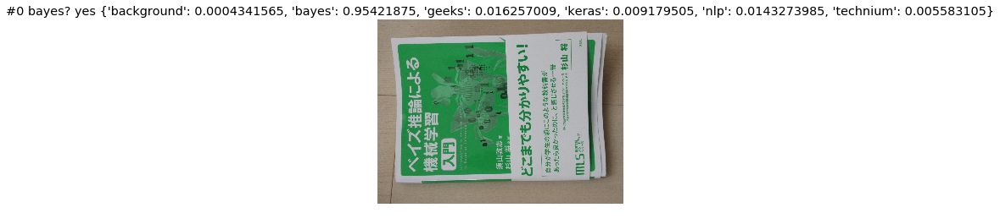

test/img_1874.jpg


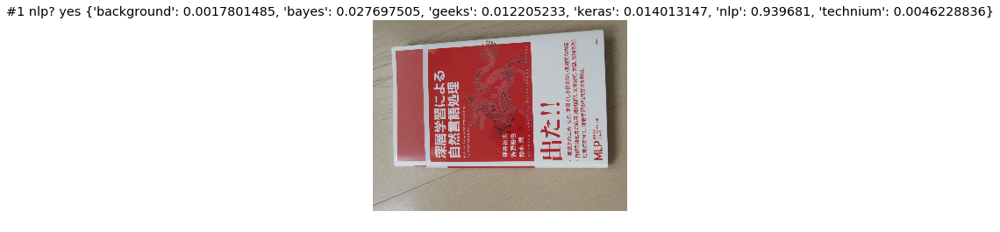

test/img_1875.jpg


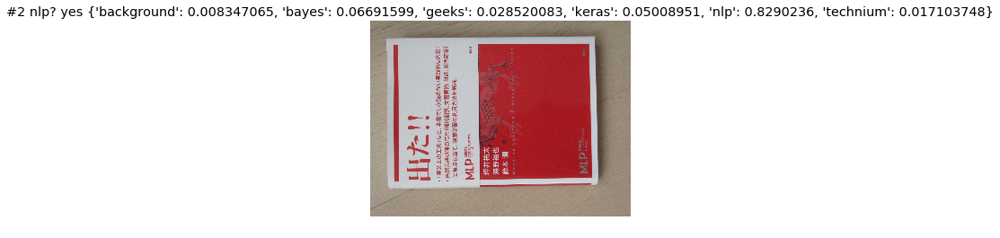

test/img_1876.jpg


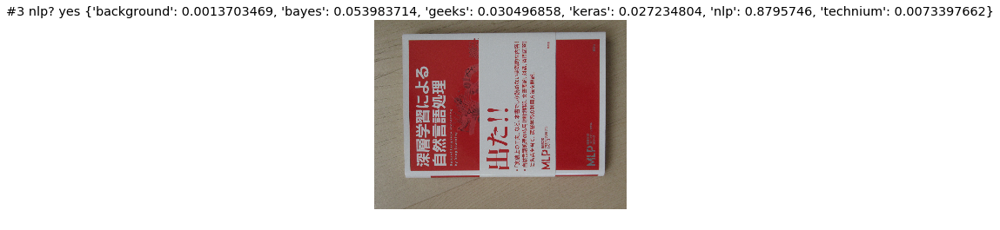

test/img_1877.jpg


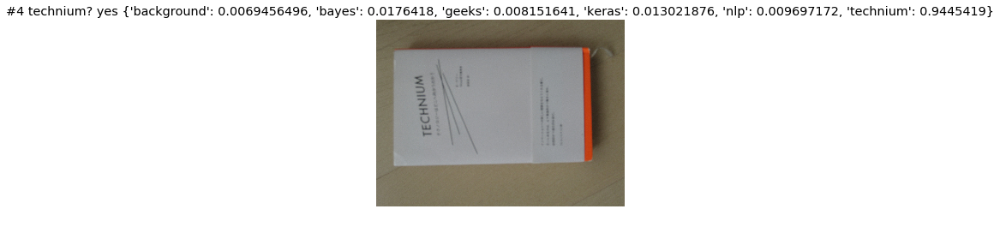

test/img_1878.jpg


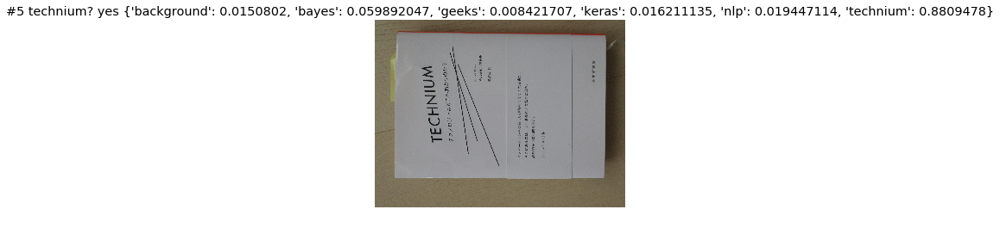

1.0

In [23]:
evaluate_test_fastai(learn, 'test', test_expected_preds, show_detail=True)

accuracy =  0.8
test_difficult/img_5490.jpg


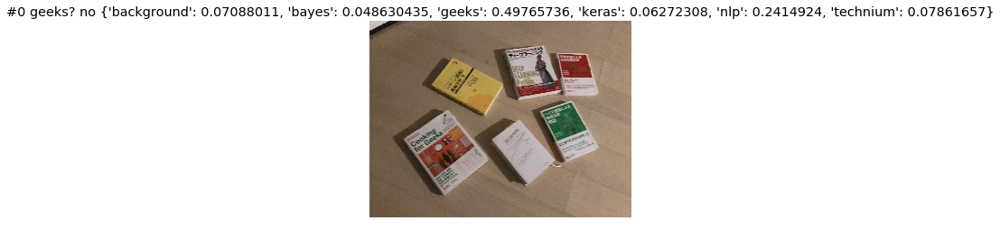

test_difficult/img_5491.jpg


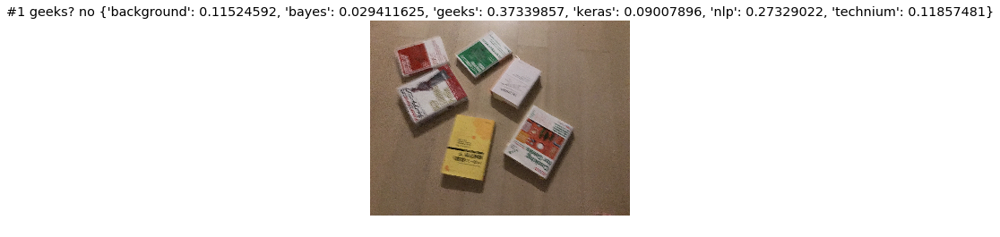

test_difficult/img_5492.jpg


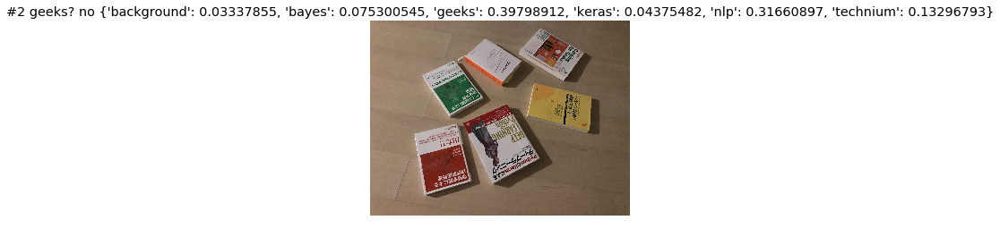

test_difficult/img_5493.jpg


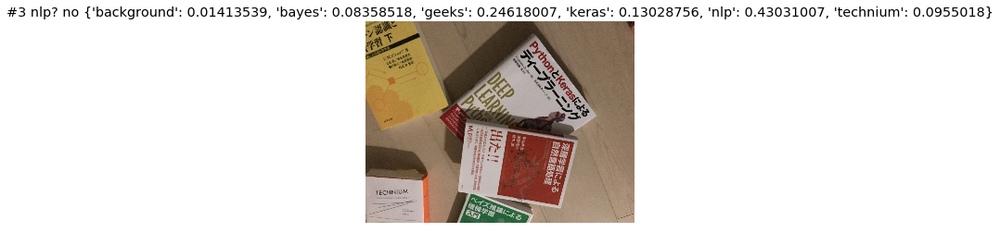

test_difficult/img_5494.jpg


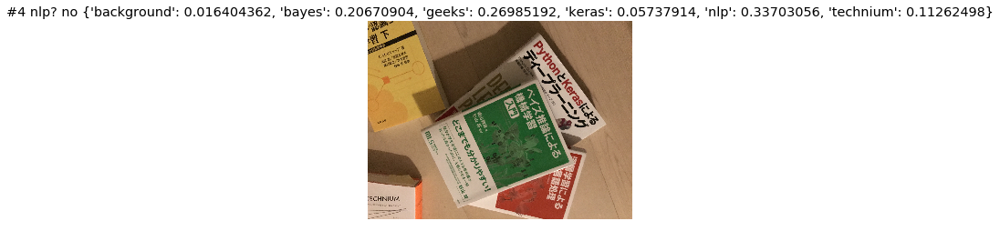

test_difficult/img_5495.jpg


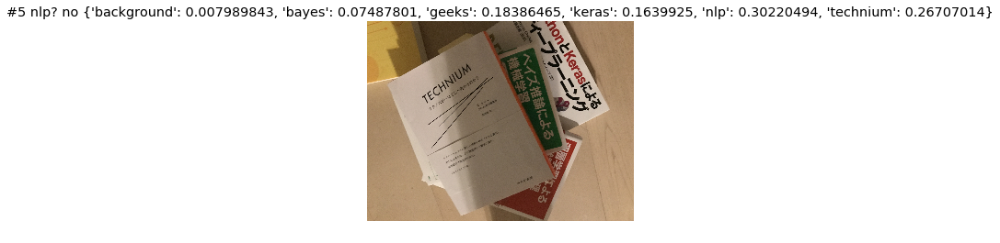

test_difficult/img_5496.jpg


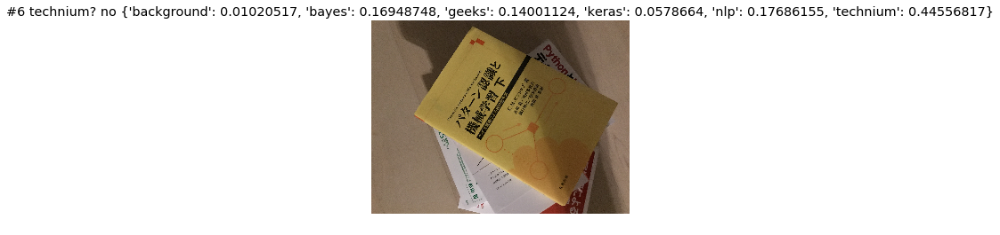

test_difficult/img_5497.jpg


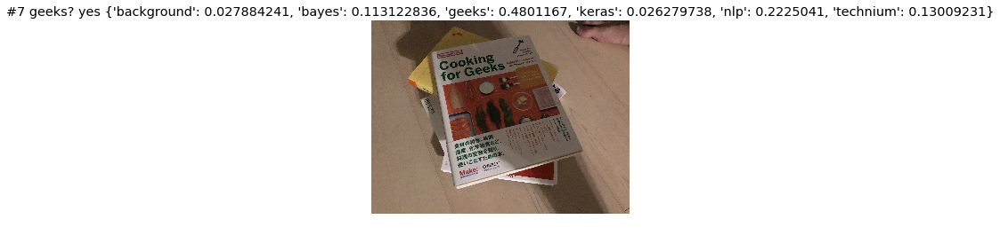

test_difficult/img_5498.jpg


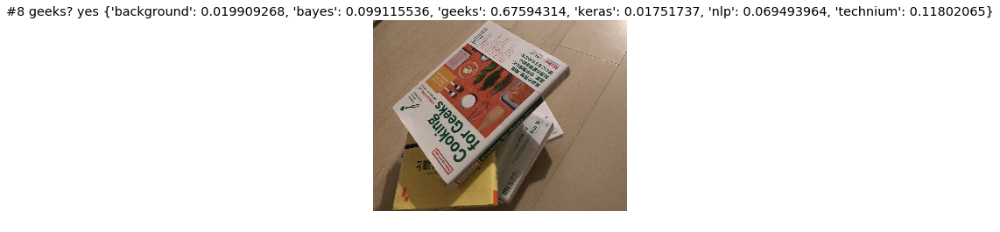

test_difficult/img_5499.jpg


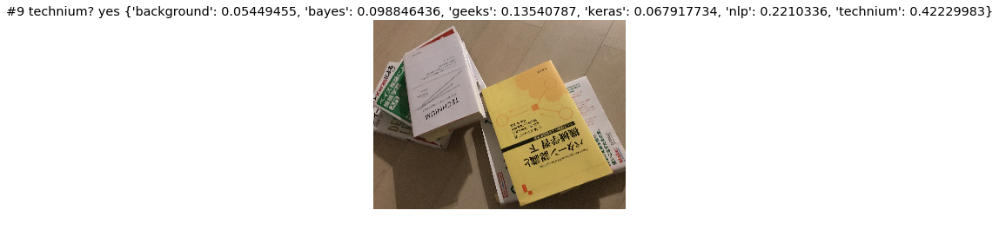

test_difficult/img_5500.jpg


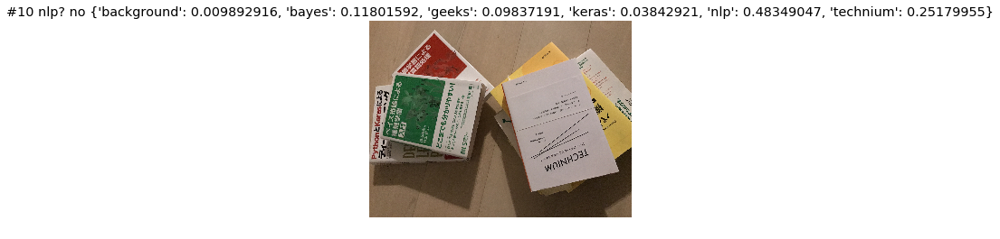

test_difficult/img_5502.jpg


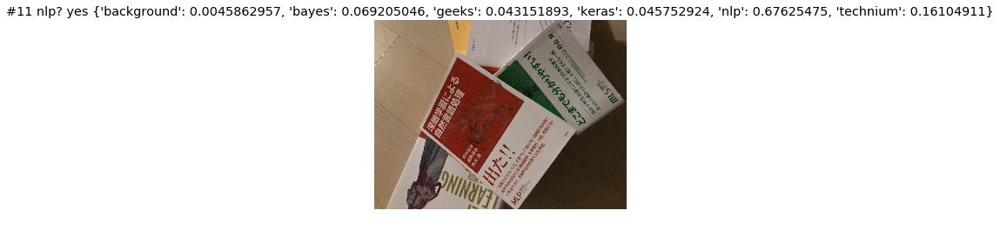

test_difficult/img_5503.jpg


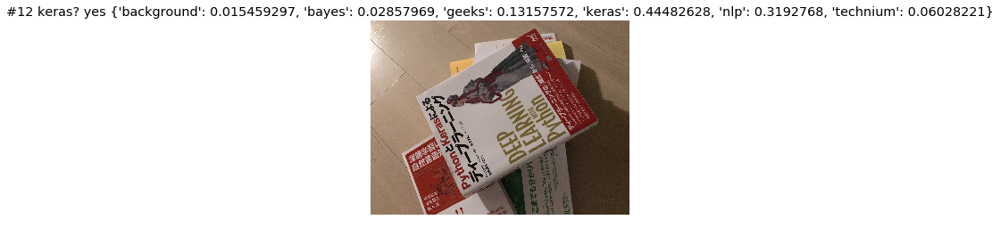

test_difficult/img_5504.jpg


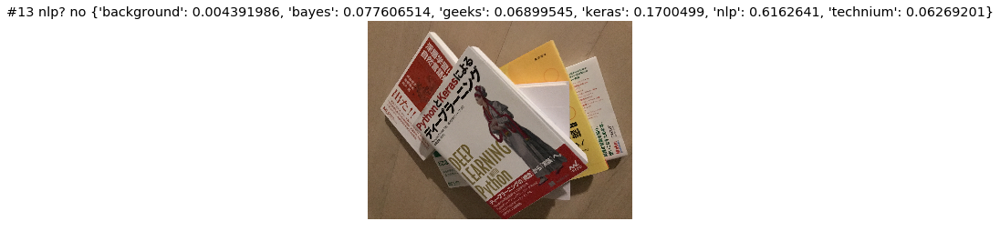

test_difficult/img_5505.jpg


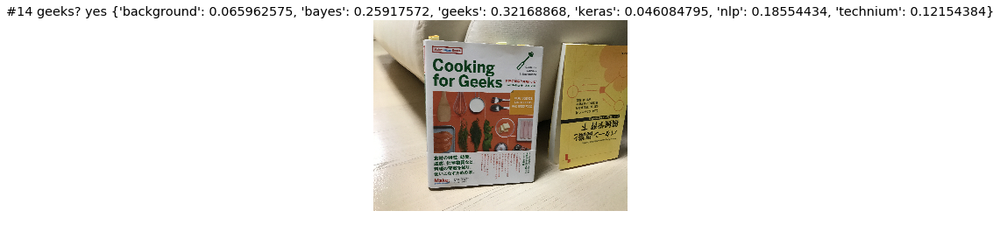

test_difficult/img_5506.jpg


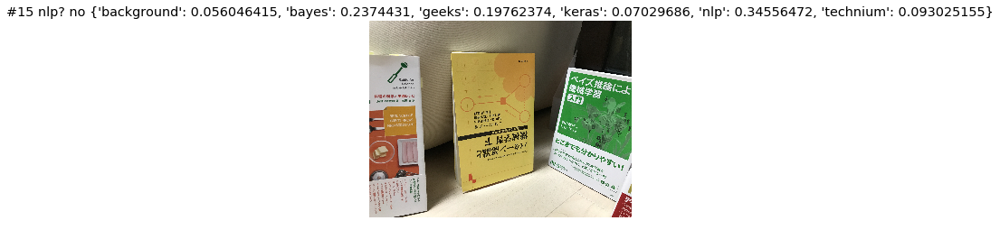

test_difficult/img_5507.jpg


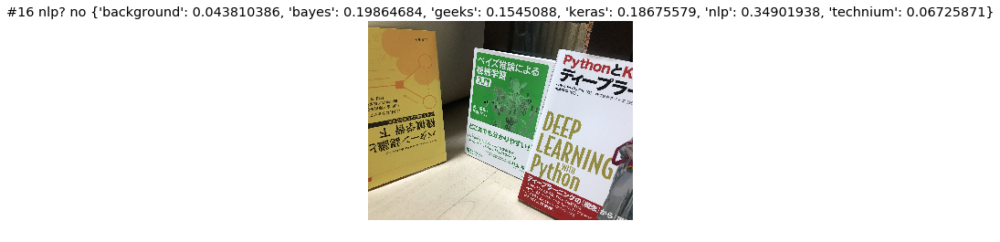

test_difficult/img_5508.jpg


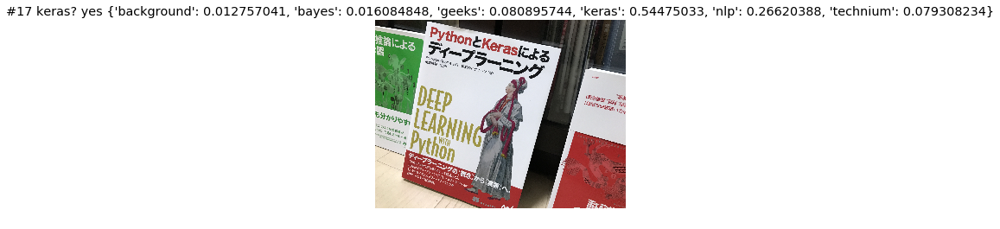

test_difficult/img_5509.jpg


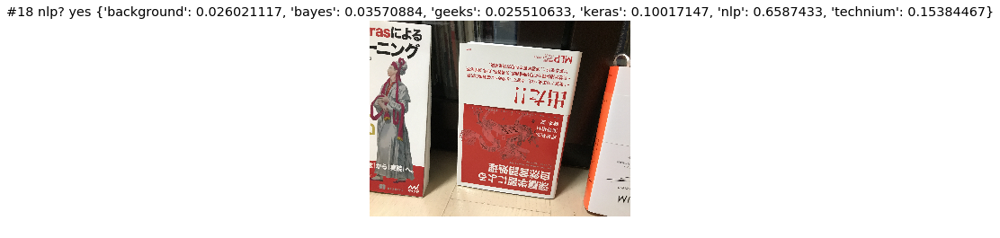

test_difficult/img_5510.jpg


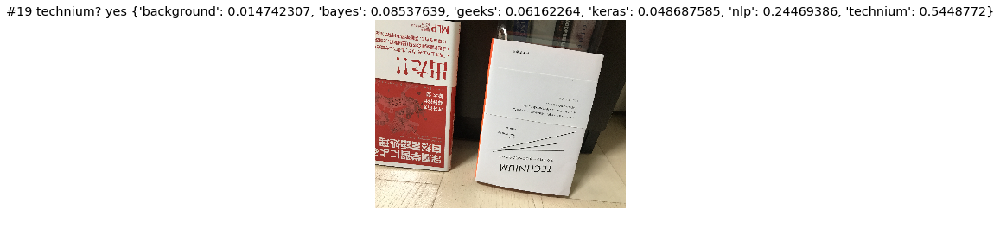

0.8

In [24]:
evaluate_test_fastai(learn, 'test_difficult', test_difficult_expected_preds, show_detail=True)

## Visualization

In [25]:
m = learn.model
m

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace)
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU(inplace)
  (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU(inplace)
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): BatchNor

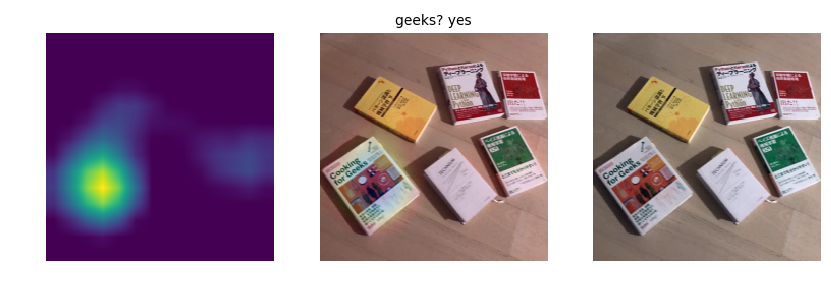

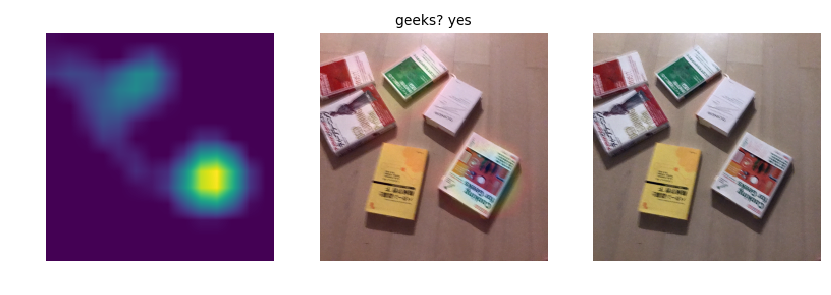

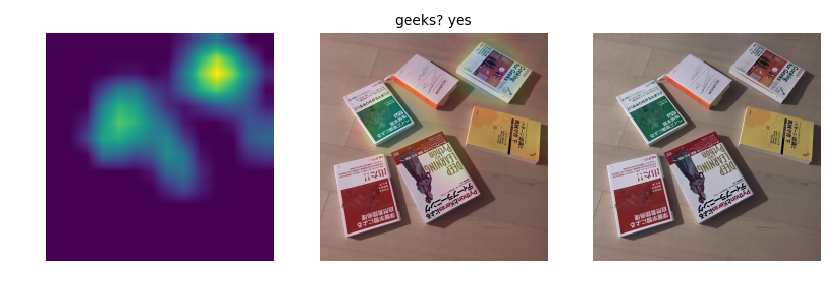

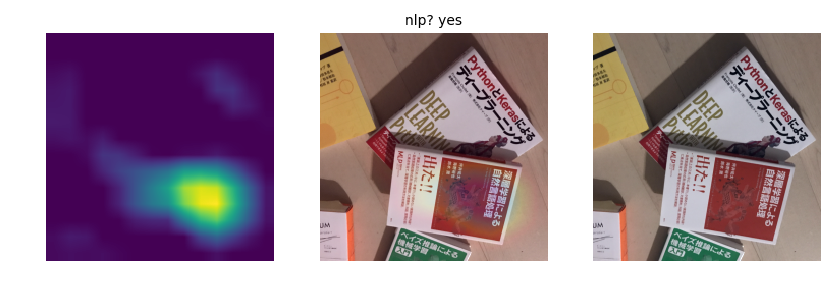

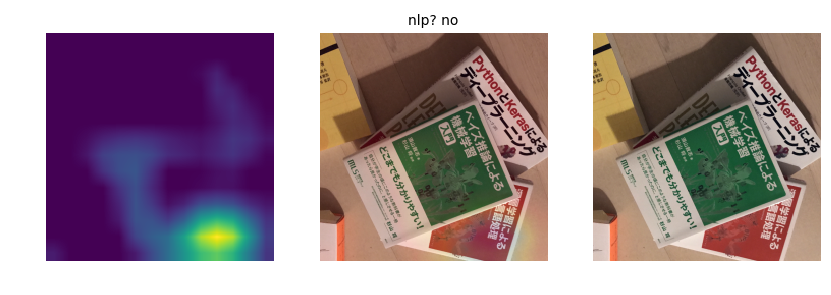

...

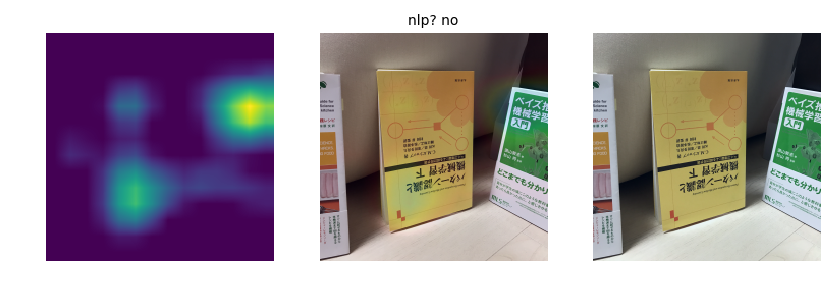

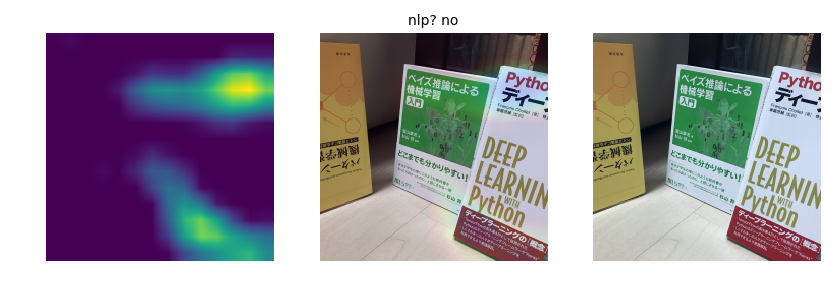

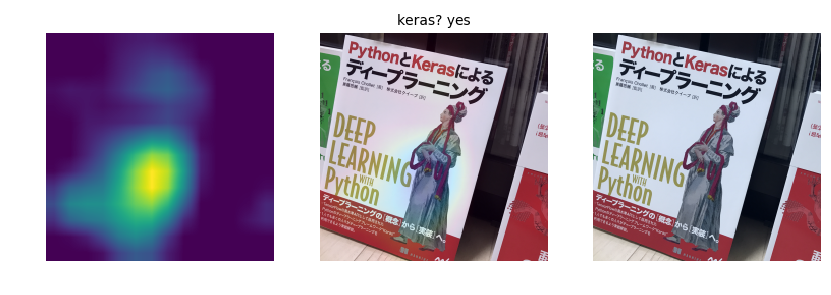

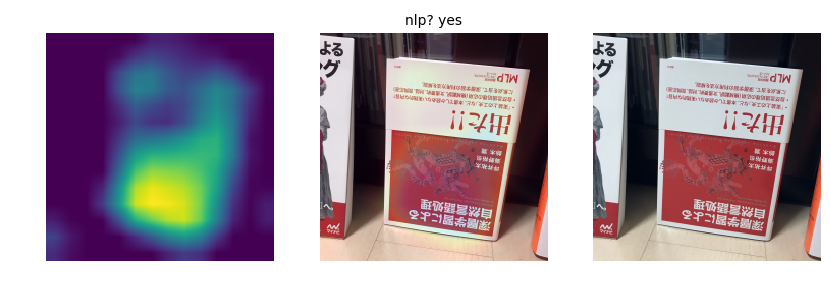

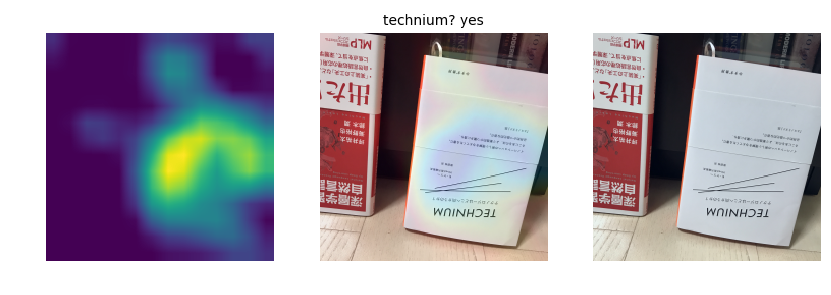

In [32]:
import cv2

class SaveFeatures():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

def imshow_friendly(img):
    img_temp = img - np.min(img)
    img_temp = img_temp/np.max(img_temp)
    friendly = np.uint8(255 * img_temp)
    return friendly

data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name='test_difficult',
                                    val_idxs=val_idxs, tfms=tfms, bs=20) #test_difficult has 20 images
xx, yy = next(iter(data.test_dl))
# sort
sorted_vars = sorted([(fn, x, y) for fn, x, y in zip(data.test_ds.fnames, to_np(xx), to_np(yy))], key=lambda x:x[0])
xx = np.array([v[1] for v in sorted_vars])
yy = np.array([v[2] for v in sorted_vars])
m = learn.model

for test_file_index in range(20):
    x, y = xx[test_file_index, ...], yy[test_file_index, ...]
    x, y = x[np.newaxis, ...], y[np.newaxis, ...]
    last_conv = -6
    sfs = [SaveFeatures(o) for o in [m[last_conv-9], m[last_conv-6], m[last_conv-3], m[last_conv]]]
    py = m(Variable(torch.from_numpy(x).float().to("cuda:0")))
    for o in sfs: o.remove()
    py = np.exp(to_np(py)[0])
    targ_class = np.argmax(py)
    result = calc_soft_acc(test_difficult_expected_preds[test_file_index], py)

    feat = np.maximum(0, to_np(sfs[3].features[0]))
    f2 = np.rollaxis(feat, 0, 3)[..., targ_class]
    f2 -= f2.min()
    f2 /= f2.max()
    heatmap = f2

    img = np.rollaxis(to_np(x[0]), 0, 3)
    fig = plt.figure(figsize=(10, 5), dpi=100)
    ax = fig.add_subplot(131)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    ax.set_axis_off()
    ax.matshow(heatmap)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = ((heatmap*0.5/np.max(heatmap) + img)) / 1.5
    ax = fig.add_subplot(132)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(superimposed))
    ax.set_title('%s? %s' % (classes[targ_class], 'yes' if result == 1 else 'no'), fontsize=10)
    ax = fig.add_subplot(133)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(img))
    fig.show()

### Title picture

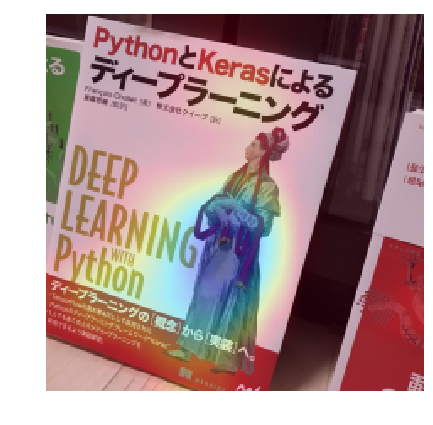

In [40]:
for test_file_index in range(17,18):
    x, y = xx[test_file_index, ...], yy[test_file_index, ...]
    x, y = x[np.newaxis, ...], y[np.newaxis, ...]
    last_conv = -6
    sfs = [SaveFeatures(o) for o in [m[last_conv-9], m[last_conv-6], m[last_conv-3], m[last_conv]]]
    py = m(Variable(torch.from_numpy(x).float().to("cuda:0")))
    for o in sfs: o.remove()
    py = np.exp(to_np(py)[0])
    targ_class = np.argmax(py)
    result = calc_soft_acc(test_difficult_expected_preds[test_file_index], py)

    feat = np.maximum(0, to_np(sfs[3].features[0]))
    f2 = np.rollaxis(feat, 0, 3)[..., targ_class]
    f2 -= f2.min()
    f2 /= f2.max()
    heatmap = f2

    img = np.rollaxis(to_np(x[0]), 0, 3)
    fig = plt.figure(figsize=(10, 5), dpi=100)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = ((heatmap*1.5/np.max(heatmap) + img)) / 2
    ax = fig.add_subplot(111)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(superimposed))
    fig.show()
    fig.savefig('2nd_title.jpg')

In [ ]:
FileLink('2nd_title.jpg')